# Глубокое обучение в компьютерном зрении

## Продвинутые архитектуры свёрточных нейросетей

### Задание 3

Обучить СНС с помощью Transfer Learning на датасете Food-101
Использовать тонкую настройку существующей предобученной модели и методы аугментации данных.
Библиотеки: [Python, Tensorflow]

#### Импорт библиотек

In [ ]:
%tensorflow_version 2.x

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import tensorflow as tf
# from tensorflow.keras.datasets import Food-101
from tensorflow.keras import utils
import tensorflow_datasets as tfds

#### Загрузка и подготовка датасета Food-101

In [ ]:
# tfds.disable_progress_bar()
(train_ds, test_ds), ds_info = tfds.load(
    'Food101', 
    as_supervised=True,
    with_info=True,
    split=['train[:90%]', 'train[90%:]'],
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incompleteDGUOAY/food101-train.tfrecord*...:   0%|          …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incompleteDGUOAY/food101-validation.tfrecord*...:   0%|     …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [ ]:
ds_info.description

"This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels."

In [ ]:
# имя класса
label_names = [
            "apple_pie",
            "baby_back_ribs",
            "baklava",
            "beef_carpaccio",
            "beef_tartare",
            "beet_salad",
            "beignets",
            "bibimbap",
            "bread_pudding",
            "breakfast_burrito",
            "bruschetta",
            "caesar_salad",
            "cannoli",
            "caprese_salad",
            "carrot_cake",
            "ceviche",
            "cheesecake",
            "cheese_plate",
            "chicken_curry",
            "chicken_quesadilla",
            "chicken_wings",
            "chocolate_cake",
            "chocolate_mousse",
            "churros",
            "clam_chowder",
            "club_sandwich",
            "crab_cakes",
            "creme_brulee",
            "croque_madame",
            "cup_cakes",
            "deviled_eggs",
            "donuts",
            "dumplings",
            "edamame",
            "eggs_benedict",
            "escargots",
            "falafel",
            "filet_mignon",
            "fish_and_chips",
            "foie_gras",
            "french_fries",
            "french_onion_soup",
            "french_toast",
            "fried_calamari",
            "fried_rice",
            "frozen_yogurt",
            "garlic_bread",
            "gnocchi",
            "greek_salad",
            "grilled_cheese_sandwich",
            "grilled_salmon",
            "guacamole",
            "gyoza",
            "hamburger",
            "hot_and_sour_soup",
            "hot_dog",
            "huevos_rancheros",
            "hummus",
            "ice_cream",
            "lasagna",
            "lobster_bisque",
            "lobster_roll_sandwich",
            "macaroni_and_cheese",
            "macarons",
            "miso_soup",
            "mussels",
            "nachos",
            "omelette",
            "onion_rings",
            "oysters",
            "pad_thai",
            "paella",
            "pancakes",
            "panna_cotta",
            "peking_duck",
            "pho",
            "pizza",
            "pork_chop",
            "poutine",
            "prime_rib",
            "pulled_pork_sandwich",
            "ramen",
            "ravioli",
            "red_velvet_cake",
            "risotto",
            "samosa",
            "sashimi",
            "scallops",
            "seaweed_salad",
            "shrimp_and_grits",
            "spaghetti_bolognese",
            "spaghetti_carbonara",
            "spring_rolls",
            "steak",
            "strawberry_shortcake",
            "sushi",
            "tacos",
            "takoyaki",
            "tiramisu",
            "tuna_tartare",
            "waffles"
        ]

### Визуализация датасета Food-101

In [ ]:
some_samples = [x for x in iter(train_ds.take(32))]

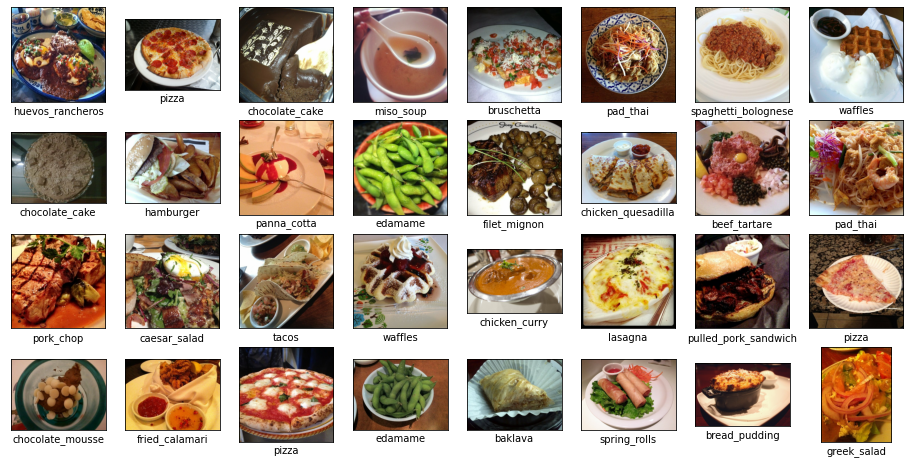

In [ ]:
#some_samples = [x[0] for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j][0].numpy())
    plt.xticks([]), plt.yticks([])
    plt.xlabel(label_names[some_samples[j][1].numpy()])
plt.show()

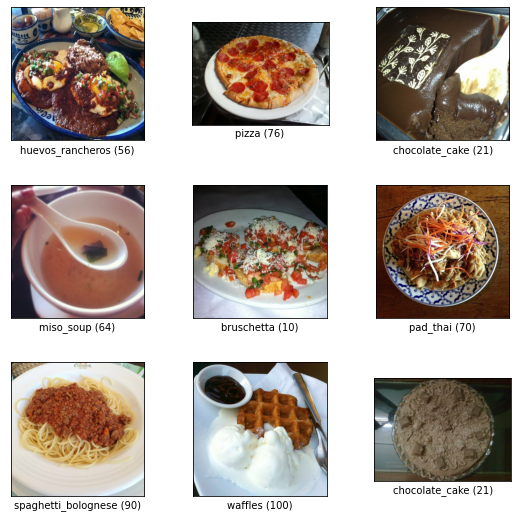

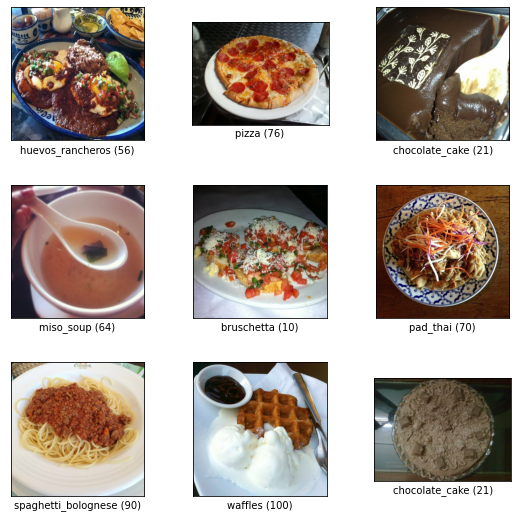

In [ ]:
tfds.visualization.show_examples(
    train_ds, ds_info
)

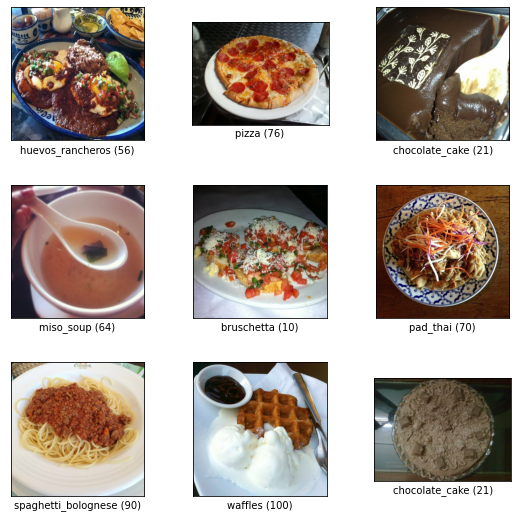

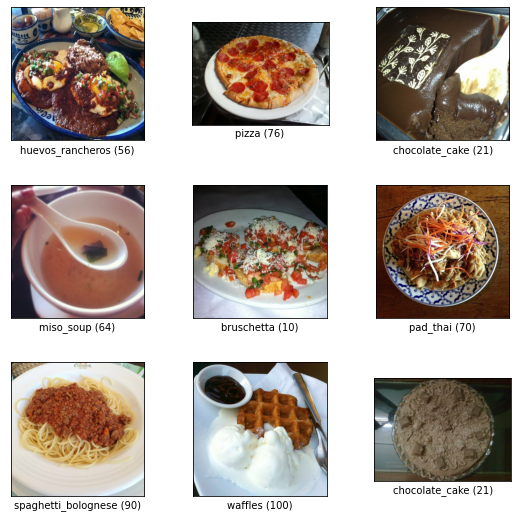

In [ ]:
tfds.show_examples(train_ds, ds_info)

## Создание пайплайна данных

In [ ]:
INP_SIZE = 160
NUM_EPOCHS = 10
BATCH_SIZE = 32

def prepare(img, label):
    img = tf.cast(img, tf.float32)/127. - 1.
    return tf.image.resize(img, (INP_SIZE, INP_SIZE)), label

In [ ]:

train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.map(prepare)
train_ds = train_ds.batch(BATCH_SIZE, drop_remainder=True)

test_ds = test_ds.shuffle(buffer_size=1000)
test_ds = test_ds.map(prepare)
test_ds = test_ds.batch(128, drop_remainder=True)

# Подготовка модели CNN

In [ ]:
if 0: # Обучение модели с нуля

    EXP_NAME = 'scratch'
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=(INP_SIZE, INP_SIZE, 3),
        include_top=False,
        weights=None,
    )
    base_model.trainable = True

else: # Transfer Learning

    EXP_NAME = 'transfer'
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=(INP_SIZE, INP_SIZE, 3),
        include_top=False,
        weights='imagenet',
    )
    # base_model.trainable = True # Fine-tuning весов предобученной модели
    base_model.trainable = False # Заморозка весов предобученной модели

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

9406464/9406464 [==============================] - 0s 0us/step


## Подготовка к обучению

In [ ]:
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.RMSprop(lr=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/'+EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


## Model Summary

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 101)               129381    
                                                                 
Total params: 2,387,365
Trainable params: 129,381
Non-trainable params: 2,257,984
_________________________________________________________________


## Обучение модели

In [ ]:
%%time

history = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/10
2130/2130 [==============================] - 181s 83ms/step - loss: 3.0062 - accuracy: 0.3081 - val_loss: 2.2702 - val_accuracy: 0.4407
Epoch 2/10
2130/2130 [==============================] - 178s 83ms/step - loss: 2.0881 - accuracy: 0.4818 - val_loss: 2.0370 - val_accuracy: 0.4902
Epoch 3/10
2130/2130 [==============================] - 206s 96ms/step - loss: 1.9183 - accuracy: 0.5195 - val_loss: 1.9675 - val_accuracy: 0.5079
Epoch 4/10
2130/2130 [==============================] - 194s 90ms/step - loss: 1.8359 - accuracy: 0.5409 - val_loss: 1.9355 - val_accuracy: 0.5196
Epoch 5/10
2130/2130 [==============================] - 181s 85ms/step - loss: 1.7813 - accuracy: 0.5556 - val_loss: 1.9120 - val_accuracy: 0.5327
Epoch 6/10
2130/2130 [==============================] - 181s 84ms/step - loss: 1.7404 - accuracy: 0.5672 - val_loss: 1.9093 - val_accuracy: 0.5364
Epoch 7/10
2130/2130 [==============================] - 179s 84ms/step - loss: 1.7074 - accuracy: 0.5768 - val_loss: 1

### Подготовка модели для Fine Tuning

In [ ]:
EXP_NAME = 'transfer_ft'
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(INP_SIZE, INP_SIZE, 3),
    include_top=False,
    weights='imagenet',
)
base_model.trainable = True # Fine-tuning весов предобученной модели
#base_model.trainable = False # Заморозка весов предобученной модели

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

In [ ]:
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.RMSprop(lr=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/'+EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

In [ ]:
%%time

history_ft = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/10
2130/2130 [==============================] - 284s 129ms/step - loss: 2.1134 - accuracy: 0.4822 - val_loss: 1.7157 - val_accuracy: 0.5686
Epoch 2/10
2130/2130 [==============================] - 280s 131ms/step - loss: 1.2083 - accuracy: 0.6794 - val_loss: 1.6866 - val_accuracy: 0.5967
Epoch 3/10
2130/2130 [==============================] - 294s 137ms/step - loss: 0.8542 - accuracy: 0.7662 - val_loss: 1.6121 - val_accuracy: 0.6273
Epoch 4/10
2130/2130 [==============================] - 302s 141ms/step - loss: 0.6065 - accuracy: 0.8304 - val_loss: 1.6631 - val_accuracy: 0.6242
Epoch 5/10
2130/2130 [==============================] - 275s 129ms/step - loss: 0.4314 - accuracy: 0.8756 - val_loss: 1.7846 - val_accuracy: 0.6205
Epoch 6/10
2130/2130 [==============================] - 269s 126ms/step - loss: 0.3048 - accuracy: 0.9105 - val_loss: 2.1614 - val_accuracy: 0.6057
Epoch 7/10
2130/2130 [==============================] - 268s 125ms/step - loss: 0.2330 - accuracy: 0.9299 - val_

### Визуализация результатов

In [ ]:
# визуализация метрики
def plot_metric(history, metric_name, title = 'History of train and val', y_lim=1):
  history_df= pd.DataFrame(history.history)
  plt.plot(history_df[metric_name], label='train')
  plt.plot(history_df['val_' + metric_name], label='test')
  plt.ylim([0, y_lim])
  plt.xlabel('Epoch')
  plt.ylabel(f'Metric [{metric_name}]')
  plt.legend()
  plt.title(title)
  plt.grid(True)

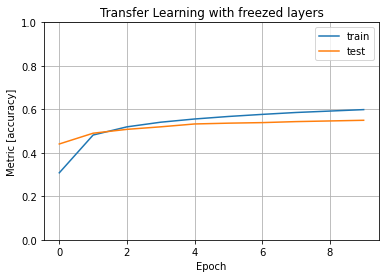

In [ ]:
plot_metric(history, 'accuracy', title='Transfer Learning with freezed layers')

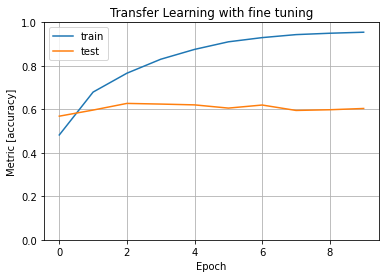

In [ ]:
plot_metric(history_ft, 'accuracy', title='Transfer Learning with fine tuning')

## Оценка качества модели

In [ ]:
%%time

model.evaluate(test_ds)

59/59 [==============================] - 19s 304ms/step - loss: 2.6601 - accuracy: 0.6038
CPU times: user 29.5 s, sys: 726 ms, total: 30.2 s
Wall time: 20.5 s


[2.660125732421875, 0.6038135886192322]

При обучении с нуля, за 10 эпох при скорости обучения 0.0001 удалось достичь accuracy = 0.2395

При обучении предобученной модели при той же скорости обучения за 10 эпох точность составила accuracy = 0.549

При обучении предобученной модели при то же скорости обучения и без заморозки слоев удалось получить accuracy = 0.604

## TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 23637), started 1:34:07 ago. (Use '!kill 23637' to kill it.)

<IPython.core.display.Javascript object>

### Подготовка для аугментации

Загружаем данные из кэша

In [ ]:
# tfds.disable_progress_bar()
(train_ds, test_ds), ds_info = tfds.load(
    'Food101', 
    as_supervised=True,
    with_info=True,
    split=['train[:90%]', 'train[90%:]'],
)

Памятка по методам аугментации    
    # случайный выбор коэфициента контрастности в диапазоне от нач. (0.1) до кон.(10.0)
    tf.keras.layers.RandomContrast([1.0, 10.0]),
    # случайные отражения и повороты
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    # приближение случайных участков изображения (для нашего случая не подойдет)
    ## tf.keras.layers.RandomZoom(.5, .2, interpolation='nearest'),
    # случайное смещение изображения внутри заданного размера - в качестве параметров исп. допустимые проценты смещения по выоте и ширине
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode="constant"),
    # обрезает случайно выбранную область изображения - первые два параметра = значению пикселей в кропнутой области
    # tf.keras.layers.RandomCrop(80, 80, 1),

In [ ]:
data_augmentation = tf.keras.Sequential(
    [tf.keras.layers.RandomFlip("horizontal_and_vertical"), tf.keras.layers.RandomRotation(0.1),]
)

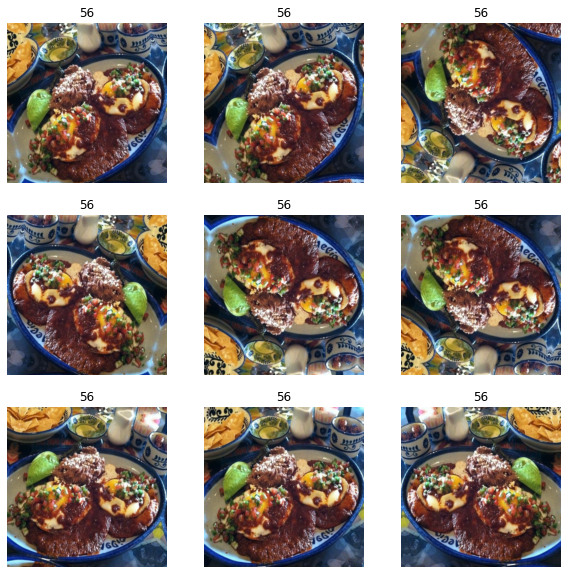

In [ ]:
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy().astype("int32"))
        plt.title(int(labels))
        plt.axis("off")

In [ ]:
EXP_NAME = 'transfer_aug'
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(INP_SIZE, INP_SIZE, 3),
    include_top=False,
    weights='imagenet',
)
# base_model.trainable = True # Fine-tuning весов предобученной модели
base_model.trainable = False # Заморозка весов предобученной модели

model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.RMSprop(lr=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/'+EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
%%time

history_ft_aug = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/10


2130/2130 [==============================] - ETA: 0s - loss: 4.6604 - accuracy: 0.0215

2130/2130 [==============================] - 246s 110ms/step - loss: 4.6604 - accuracy: 0.0215 - val_loss: 4.5755 - val_accuracy: 0.0301
Epoch 2/10
2130/2130 [==============================] - 246s 115ms/step - loss: 4.5383 - accuracy: 0.0310 - val_loss: 4.5296 - val_accuracy: 0.0363
Epoch 3/10
2130/2130 [==============================] - 269s 125ms/step - loss: 4.4923 - accuracy: 0.0363 - val_loss: 4.5093 - val_accuracy: 0.0368
Epoch 4/10
1380/2130 [==================>...........] - ETA: 1:14 - loss: 4.4669 - accuracy: 0.0403

KeyboardInterrupt: ignored

!!! Ерунда получается (!!!

### Добавим Fine Tuning

In [ ]:
base_model.trainable = True # Fine-tuning весов предобученной модели
model.summary()
# уменьшим скорость обучения для fine tuning
LEARNING_RATE = 1e-5
optimizer = tf.keras.optimizers.RMSprop(lr=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
EXP_NAME = 'transfer_aug_ft'
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/'+EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

In [ ]:
# Дообучение
history_ft_aug_ft = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

In [ ]:
plot_metric(history_ft_aug, 'accuracy', title='Transfer Learning with augmentation')

In [ ]:
plot_metric(history_ft_aug_ft, 'accuracy', title='Transfer Learning with augmentation and fine tuning')

### Вторая сессия - аугментация и дообучение

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs